<a href="https://colab.research.google.com/github/EsteArgen/Aspectos_Aritmeticos_Teoria_Ehrhart/blob/main/Envolvente_Convexa.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

<center>

**Aspectos Aritméticos de la Teoría de Ehrhart**

</center>

<p align="center">
    <img src="https://logowik.com/content/uploads/images/escudo-de-la-universidad-nacional-de-colombia-20163327.logowik.com.webp" width="400">
</p>



<center>

# **Algoritmos para calcular la Envolvente Convexa**

## **Graham Scan**

<center>

<div align="justify">

**Introducción**

Sea $S = \{p_1, p_2, \dots, p_n\} \subset \mathbb{R}^2$ un conjunto finito de puntos en el plano euclidiano. El objetivo de la envolvente convexa es determinar el menor subconjunto de puntos de $S$ que define un polígono convexo  $\mathcal{H}(S) \subset \mathbb{R}^2$, tal que todos los puntos de $S$ se encuentren en su interior o sobre su frontera. Por lo que, se representa del siguiente modo:

$$
\text{conv}(S) = \left\{ \sum_{i=1}^{n} \lambda_i p_i \;\middle|\; \lambda_i \geq 0,\; \sum_{i=1}^{n} \lambda_i = 1 \right\}
$$

donde $p_i \in S$ y $\lambda_i$ son coeficientes reales que representan combinaciones convexas.


**Fundamento del Algoritmo**

El algoritmo de Graham Scan (Graham, 1972) se fundamenta en la noción de ordenamiento angular polar y en el análisis geométrico del sentido del giro entre tripletas de puntos consecutivos. Su objetivo es construir una secuencia de puntos $\{q_1, q_2, \dots, q_h\} \subseteq S,$ que describen el contorno de la envolvente convexa $\mathcal{H}(S)$ de forma ordenada (típicamente en sentido antihorario).


**Procedimiento Algorítmico**

Sea $S = {p_1, p_2, \dots, p_n} \subset \mathbb{R}^2$ un conjunto de puntos en el plano. El objetivo es determinar la envolvente convexa $\mathcal{H}(S)$ usando el algoritmo de Graham Scan.



1. **Selección del punto de referencia**

   Seleccionar el punto $p_0 \in S$ tal que tenga la menor coordenada $y$. En caso de empate, se elige el que tenga menor coordenada $x$:

   $$p_0 = \arg\min_{p_i \in S} (y_i, x_i)$$

   Este punto sirve como pivote para el ordenamiento angular de los restantes.


2. **Ordenamiento por ángulo polar**

   Se ordena el conjunto $S' = S \setminus \{p_0\}$ de acuerdo con el **ángulo polar** $\theta \in [0, 2\pi)$ que cada punto $p_i \in S'$ forma con el eje horizontal respecto a $p_0$. Este ángulo puede calcularse mediante la función arcotangente:

   $$\theta_i = \arctan\left(\frac{y_i - y_0}{x_i - x_0}\right)$$

   En la práctica, se utiliza la función $\text{atan2}(y_i - y_0, x_i - x_0)$ para manejar correctamente los cuadrantes.

   Si dos puntos poseen el mismo ángulo, se prioriza el más cercano a $p_0$, es decir, aquel con menor distancia euclidiana:

   $$\|p_i - p_0\|_2 = \sqrt{(x_i - x_0)^2 + (y_i - y_0)^2}$$

3. **Construcción iterativa mediante estructura de pila**

   Sea $L = [p_0, p_1, \dots, p_n]$ el arreglo de puntos ordenado. Se inicializa una pila $\mathcal{P}$ con los primeros tres puntos de $L$:

   $$\mathcal{P} = [p_0, p_1, p_2]$$

   A partir del índice $i = 3$, se itera sobre el resto del arreglo, y en cada paso se evalúa la orientación del triplete de puntos formado por los dos elementos superiores de la pila y el nuevo candidato $p_i$.

4. **Determinación del sentido del giro**

   La orientación entre tres puntos consecutivos $A = (x_1, y_1)$, $B = (x_2, y_2)$, $C = (x_3, y_3)$ se evalúa utilizando el producto vectorial en $\mathbb{R}^2$:

   $$\mathrm{orientaci\acute{o}n}(A, B, C) = (x_2 - x_1)(y_3 - y_1) - (y_2 - y_1)(x_3 - x_1)$$

  El resultado tiene la siguiente interpretación:

  - $> 0$: giro a la izquierda (válido)
  - $< 0$: giro a la derecha (se elimina el segundo punto de la pila)
  - $= 0$: puntos colineales (se puede optar por eliminar el punto intermedio)

  Este procedimiento garantiza la exclusión de puntos interiores y colineales que no forman parte del contorno convexo.

5. **Finalización**
  
  Una vez procesados todos los puntos, la pila $\mathcal{P}$ contendrá, en orden, los vértices de la envolvente convexa $\mathcal{H}(S)$.


**Análisis de Complejidad**

Para esto se analizan diferentes fases:

- Selección de $p_0$: $\mathcal{O}(n)$
- Ordenamiento angular: $\mathcal{O}(n \log n)$
- Construcción de la envolvente (uso de pila): Cada punto se inserta y se elimina a lo sumo una vez, resultando en $\mathcal{O}(n)$

Por tanto, la complejidad total es:

$$
\mathcal{T}(n) = \mathcal{O}(n \log n)
$$

Este resultado es óptimo bajo el modelo comparativo, ya que el ordenamiento angular requiere al menos $\Omega(n \log n)$ comparaciones en el peor caso.

</div>

<center>

> ⚠️ **Nota**: El código que se presenta a continuación ha sido adaptado y comentado a partir del repositorio original de Rodolfo Ferro en GitHub, citado en la sección de Referencias Bibliográficas.



<center>

**📥Importaciones📦**

In [ ]:
import sys
import numpy as np
import matplotlib.pyplot as plt

### **Implementación estática**

**👨‍💻Implementación👩‍💻**

In [ ]:
"Función para determinar si el giro entre tres puntos es a la izquierda (sentido antihorario)"
"Devuelve True si hay giro a la izquierda, False si es a la derecha o los puntos son colineales"

def GiroALaIzquierda(p1, p2, p3):
    if (p3[1] - p1[1]) * (p2[0] - p1[0]) >= (p2[1] - p1[1]) * (p3[0] - p1[0]):
        return False
    return True


**👨‍💻Implementación👩‍💻**

In [ ]:
"Implementación del algoritmo de Graham Scan para calcular la envolvente convexa"

def GrahamScan(puntos):

    "Ordenamos los puntos por coordenada x (y por y en caso de empate)"
    puntos.sort()

    "---------------------------------------------------"
    "Construcción de la parte superior de la envolvente"
    "---------------------------------------------------"

    "Inicializamos con los dos primeros puntos más a la izquierda"
    parte_superior = [puntos[0], puntos[1]]

    for i in range(2, len(puntos)):

        "Agregamos el siguiente punto en orden"
        parte_superior.append(puntos[i])

        while len(parte_superior) > 2 and not GiroALaIzquierda(parte_superior[-1], parte_superior[-2], parte_superior[-3]):
            "Quitamos el punto intermedio que no forma parte del contorno"
            del parte_superior[-2]

    "---------------------------------------------------"
    "Construcción de la parte inferior de la envolvente"
    "---------------------------------------------------"

    "Empezamos desde el punto más a la derecha"
    parte_inferior = [puntos[-1], puntos[-2]]

    "Recorremos en orden inverso"
    for i in range(len(puntos) - 3, -1, -1):
        parte_inferior.append(puntos[i])

        while len(parte_inferior) > 2 and not GiroALaIzquierda(parte_inferior[-1], parte_inferior[-2], parte_inferior[-3]):
            "Eliminamos el punto intermedio"
            del parte_inferior[-2]

    "Eliminamos el primer y último punto de la parte inferior para evitar duplicados"
    del parte_inferior[0]
    del parte_inferior[-1]

    "Concatenamos las dos partes para formar la envolvente completa"
    envolvente = parte_superior + parte_inferior

    return np.array(envolvente)



**👨‍💻Implementación👩‍💻**

In [ ]:

def principal():
    try:
        N = int(sys.argv[1])
    except:
        N = int(input("Introduce el número de puntos N: "))

    puntos = [(np.random.randint(0, 3000), np.random.randint(0, 3000)) for _ in range(N)]
    envolvente = GrahamScan(puntos)
    puntos = np.array(puntos)
    plt.figure()
    plt.plot(envolvente[:, 0], envolvente[:, 1], 'b-', picker=6, linewidth = 1.0)
    plt.plot([envolvente[-1, 0], envolvente[0, 0]], [envolvente[-1, 1], envolvente[0, 1]], 'b-', picker=5, linewidth = 1.0)
    plt.plot(puntos[:, 0], puntos[:, 1], ".g")
    plt.axis('off')
    plt.show()


**👨‍💻Implementación👩‍💻**

Introduce el número de puntos N: 300


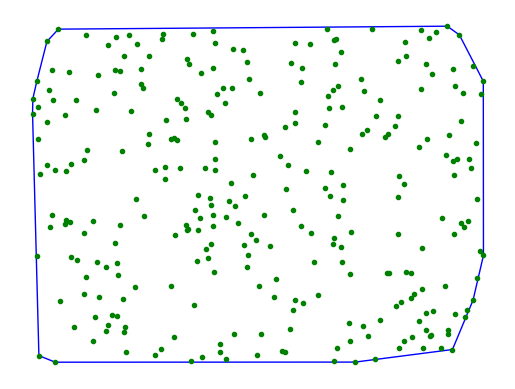

In [ ]:

principal()

<center>

### **Implementación dinámica**

**👨‍💻Implementación👩‍💻**

In [ ]:
"Función principal del algoritmo de Graham Scan"

def GrahamScan(puntos):
    puntos.sort()
    puntos = np.array(puntos)
    plt.figure()

    "---------------------------------------------------"
    "Construcción de la parte superior de la envolvente"
    "---------------------------------------------------"

  "Iniciamos con los dos primeros puntos más a la izquierda"
    parte_superior = [puntos[0], puntos[1]]

    for i in range(2, len(puntos)):

        "Agregamos el siguiente punto en orden"
        parte_superior.append(puntos[i])

        "Verificamos si el último giro es válido (giro a la izquierda). Si no lo es, eliminamos el punto intermedio"
        while len(parte_superior) > 2 and not GiroALaIzquierda(parte_superior[-1], parte_superior[-2], parte_superior[-3]):
            del parte_superior[-2]

        "Visualización del estado actual de la envolvente superior"
        envolvente_parcial = np.array(parte_superior)
        plt.clf()
        plt.plot(envolvente_parcial[:, 0], envolvente_parcial[:, 1], 'b-', linewidth=2)
        plt.plot(puntos[:, 0], puntos[:, 1], ".r", markersize=6)
        plt.axis('off')
        plt.show(block=False)
        plt.pause(0.0000001)

    "---------------------------------------------------"
    "Construcción de la parte inferior de la envolvente"
    "---------------------------------------------------"

    "Comenzamos desde los puntos más a la derecha"
    parte_inferior = [puntos[-1], puntos[-2]]

    for i in range(len(puntos) - 3, -1, -1):

        "Recorremos los puntos en orden inverso"
        parte_inferior.append(puntos[i])

        "Verificamos si hay giro válido, eliminamos si no lo es"
        while len(parte_inferior) > 2 and not GiroALaIzquierda(parte_inferior[-1], parte_inferior[-2], parte_inferior[-3]):
            del parte_inferior[-2]

        "Visualización del estado actual con parte inferior incluida"
        envolvente_parcial = np.array(parte_superior + parte_inferior)
        plt.clf()
        plt.plot(envolvente_parcial[:, 0], envolvente_parcial[:, 1], 'b-', linewidth=2)
        plt.plot(puntos[:, 0], puntos[:, 1], ".r", markersize=6)
        plt.axis('off')
        plt.show(block=False)
        plt.pause(0.0000001)



    "Eliminamos los puntos duplicados entre la parte inferior y superior"
    del parte_inferior[0]
    del parte_inferior[-1]

    "Combinamos ambas partes para obtener la envolvente convexa completa"
    envolvente_completa = parte_superior + parte_inferior
    plt.clf()
    envolvente = np.array(envolvente_completa)
    plt.plot(envolvente[:, 0], envolvente[:, 1], 'b-', linewidth=2)
    plt.plot([envolvente[-1, 0], envolvente[0, 0]], [envolvente[-1, 1], envolvente[0, 1]], 'b-', linewidth=2)
    plt.plot(puntos[:, 0], puntos[:, 1], ".r", markersize=6)
    plt.axis('off')
    plt.show()

    return envolvente

**👨‍💻Implementación👩‍💻**

In [ ]:

def main():
    try:
        N = int(sys.argv[1])
    except:
        N = int(input("Introduce el número de puntos N: "))

    puntos = [(np.random.randint(-300, 300), np.random.randint(-300, 300)) for _ in range(N)]
    envolvente = GrahamScan(puntos)




**👨‍💻Implementación👩‍💻**

Introduce el número de puntos N: 300


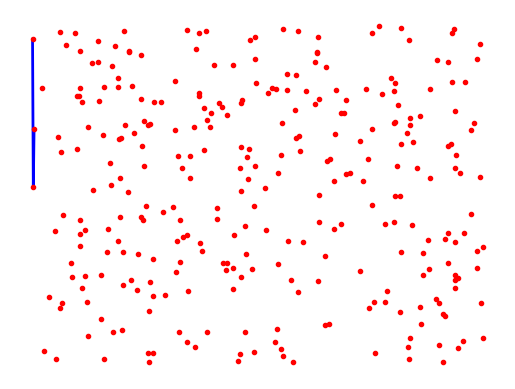

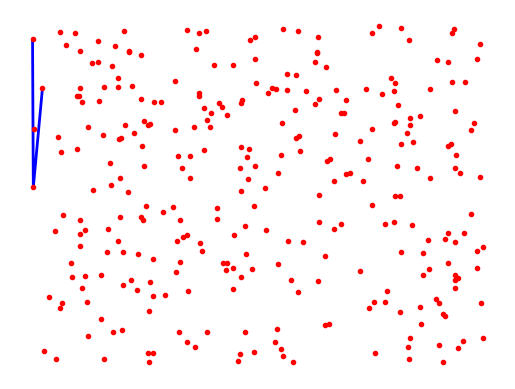

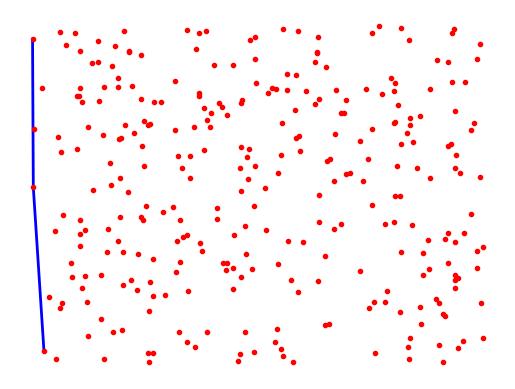

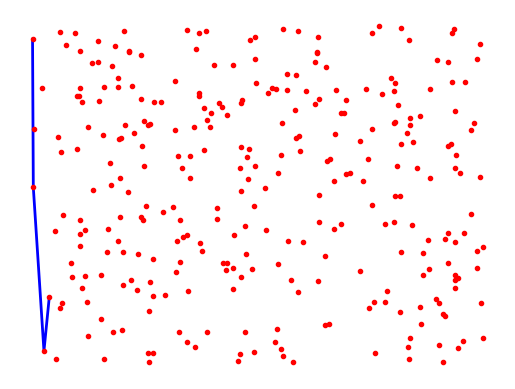

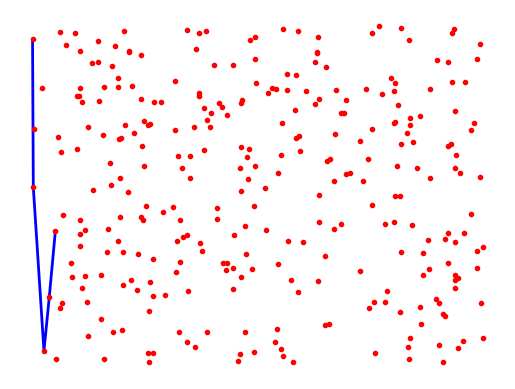

...

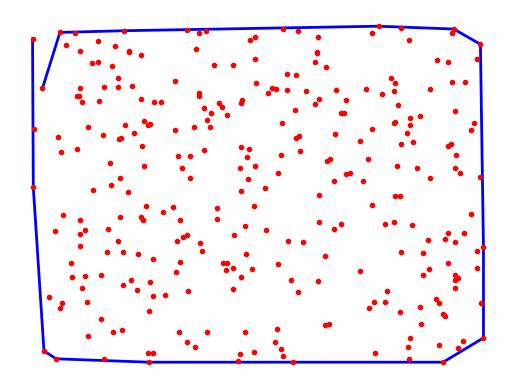

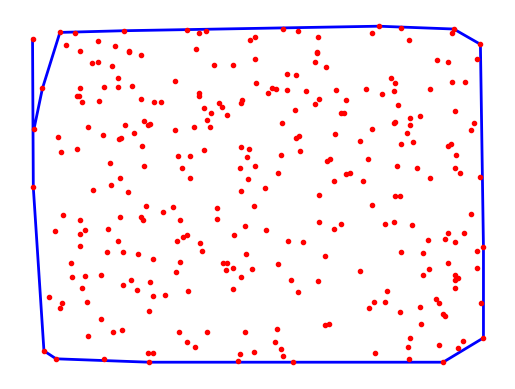

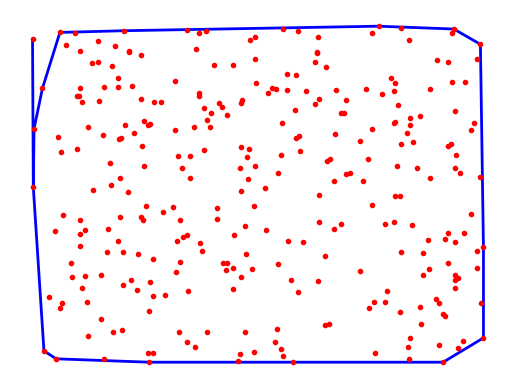

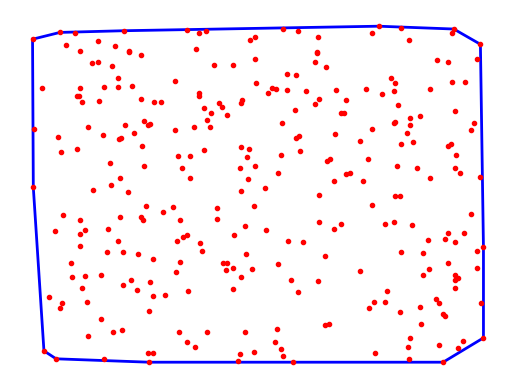

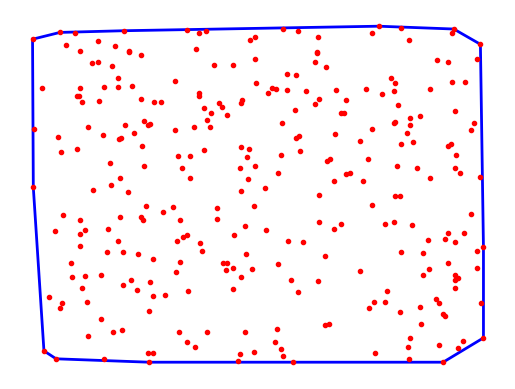

In [ ]:

main()

<center>

## **Quickhull**

<CENTER>

<div align="justify">

**Fundamentos del Algoritmo**

El algoritmo Quickhull es una estrategia de tipo divide y vencerás, muy similar conceptualmente al algoritmo de Quicksort. Su propósito es encontrar todos los puntos que forman parte de la envolvente convexa de un conjunto de puntos en 2D (aunque es extensible a dimensiones superiores).

 -  **Intuición del algoritmo:**



1.   Se seleccionan los dos puntos extremos (mínimo y máximo en el eje 𝑥).
2.   Se construye una línea entre ellos, dividiendo el conjunto en dos mitades: puntos por encima y puntos por debajo.
3. Para cada mitad:

   - Se busca el punto más alejado de la línea base.
   - Este punto forma un triángulo con los dos extremos.
   - Los puntos dentro de ese triángulo son eliminados (ya que están dentro de la envolvente convexa).
   - Se repite el proceso recursivamente sobre los subconjuntos restantes.

4. Al finalizar, se unen todos los puntos identificados para formar el polígono convexo.


**Procedimiento Algorítmico**

Sea $S = \{p_1, p_2, \dots, p_n\} \subset \mathbb{R}^2$ un conjunto finito de puntos en el plano. El algoritmo Quickhull construye la envolvente convexa $\mathcal{H}(S)$ mediante una estrategia recursiva de tipo divide y vencerás.


1. **Selección de puntos extremos**

   Se determinan los puntos más a la izquierda y a la derecha según la coordenada $x$, denotados como $p_{\min}$ y $p_{\max}$:

   $$p_{\min} = \arg\min_{p_i \in S} (x_i), \quad p_{\max} = \arg\max_{p_i \in S} (x_i)$$

   Estos puntos forman la línea base $\overline{p_{\min}p_{\max}}$ que divide el conjunto original.

2. **División del conjunto**

   Se divide el conjunto $S$ en dos subconjuntos disjuntos:

   - $S_{\text{arriba}} = \{p \in S \mid p\ \text{ se encuentra sobre la recta } \overline{p_{\min}p_{\max}} \}$  
   - $S_{\text{abajo}} = \{p \in S \mid p\ \text{ se encuentra bajo la recta } \overline{p_{\min}p_{\max}} \}$

3. **Búsqueda del punto más lejano**

   Para cada subconjunto, se determina el punto $p_f$ más alejado de la línea $\overline{p_ap_b}$, utilizando la distancia perpendicular desde un punto a una recta:

   $$d(p, \overline{ab}) = \frac{|(b_x - a_x)(a_y - p_y) - (a_x - p_x)(b_y - a_y)|}{\sqrt{(b_x - a_x)^2 + (b_y - a_y)^2}}$$

4. **Eliminación de puntos interiores**

  Se forma el triángulo $\triangle p_a p_f p_b$ y se eliminan todos los puntos dentro de él. Sólo se conservan los que están fuera y forman parte de la envolvente.

5. **Recursión**

   Se repite el proceso recursivamente para los subconjuntos:

    - Entre $p_a$ y $p_f$
    - Entre $p_f$ y $p_b$

   Este proceso continúa hasta que no existan puntos fuera del polígono parcial actual.

6. **Unión de resultados**

   Se concatenan todos los puntos extremos obtenidos durante la recursión para formar la envolvente convexa final:

   $$\mathcal{H}(S) = \text{Ordenar puntos frontera en sentido antihorario}$$




</div>

<center>

**📥Importaciones📦**

In [ ]:
from scipy.spatial import ConvexHull

**👨‍💻Implementación👩‍💻**

In [ ]:

def visualizar_envolvente_convexa():
    # Solicitar al usuario el número de puntos
    while True:
        try:
            N = int(input("Introduce el número de puntos (recomendado entre 5 y 50): "))
            if N < 3:
                print("Debe haber al menos 3 puntos para formar una envolvente convexa.")
            else:
                break
        except ValueError:
            print("Por favor, introduce un número entero válido.")

    PAUSA = 0.8

    "Generación de puntos aleatorios en 2D"
    np.random.seed(42)  #
    puntos = np.random.randint(0, 300, size=(N, 2))
    plt.figure(figsize=(8, 8))
    plt.title("Paso 0: Puntos generados")
    plt.scatter(puntos[:, 0], puntos[:, 1], color='dodgerblue', s=60, label='Puntos')
    plt.legend()
    plt.axis('equal')
    plt.grid(True)
    plt.pause(PAUSA)

    "Calcular la envolvente convexa"
    hull = ConvexHull(puntos)

    for paso, simplex in enumerate(hull.simplices):
        plt.clf()
        plt.title(f"Paso {paso + 1}: Añadiendo arista {paso + 1}")
        plt.scatter(puntos[:, 0], puntos[:, 1], color='dodgerblue', s=60, label='Puntos')

        for i in range(paso + 1):
            inicio = puntos[hull.simplices[i, 0]]
            fin = puntos[hull.simplices[i, 1]]
            plt.plot([inicio[0], fin[0]], [inicio[1], fin[1]], 'r-', linewidth=2.5)

        plt.axis('equal')
        plt.grid(True)
        plt.legend()
        plt.pause(PAUSA)

    plt.title("Envolvente Convexa Completa")
    plt.scatter(puntos[:, 0], puntos[:, 1], color='dodgerblue', s=60)
    for simplex in hull.simplices:
        plt.plot(puntos[simplex, 0], puntos[simplex, 1], 'r-', linewidth=2.5)
    plt.axis('equal')
    plt.grid(True)
    plt.show()

**👨‍💻Implementación👩‍💻**

Introduce el número de puntos (recomendado entre 5 y 50): 20


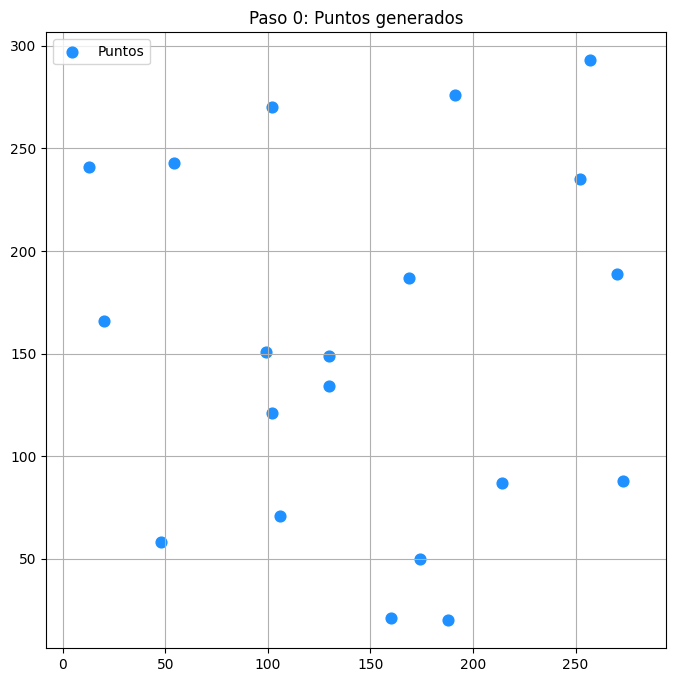

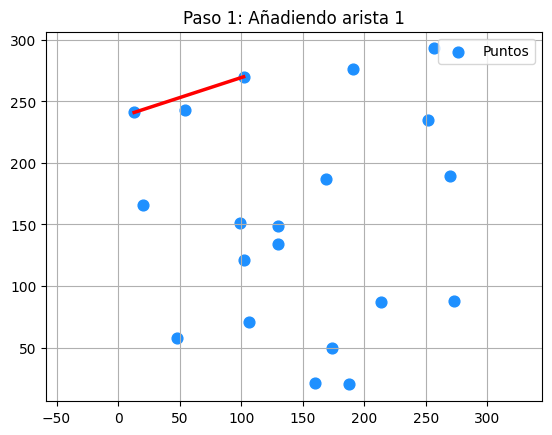

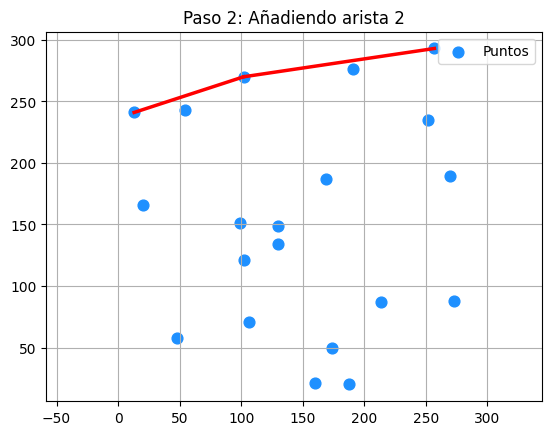

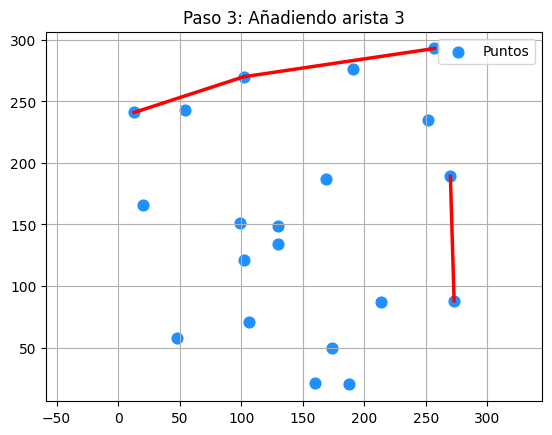

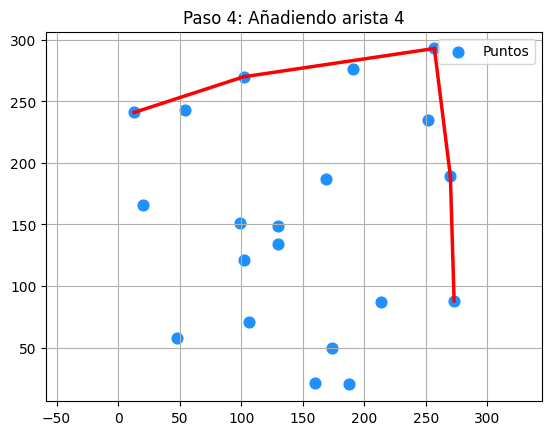

...

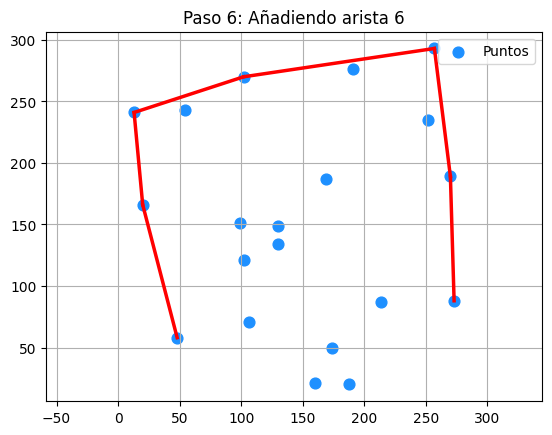

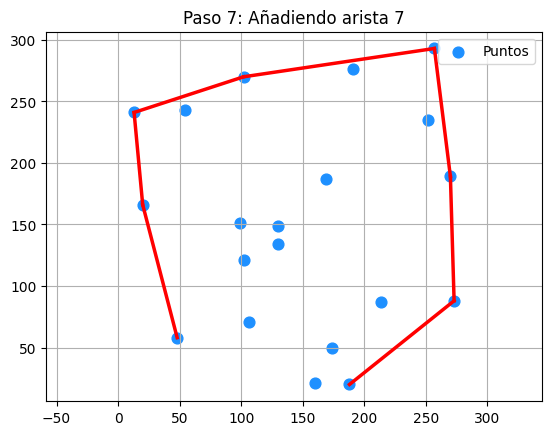

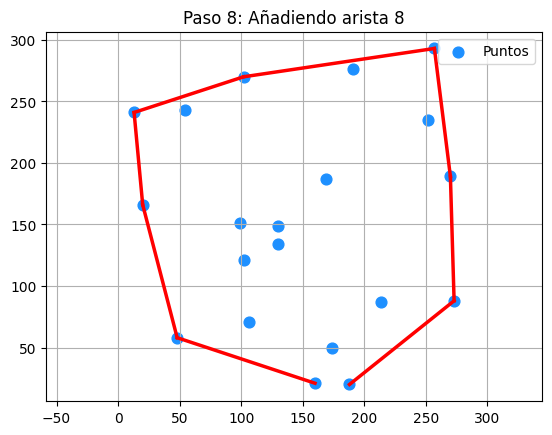

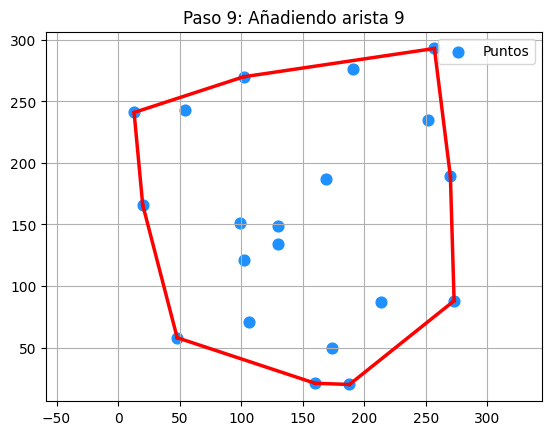

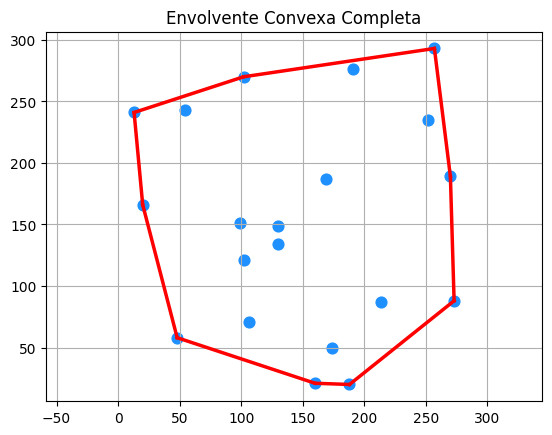

In [ ]:
visualizar_envolvente_convexa()

<center>

# **Aplicaciones a problemas cotidianos**

<center>

<div align="justify">

**Introducción**

La matemática, más allá de su formulación teórica, tiene un enorme poder expresivo cuando se aplica al estudio de fenómenos reales. En particular, la geometría computacional ofrece herramientas que permiten modelar y analizar configuraciones espaciales en disciplinas tan diversas como la biología, la robótica, y más recientemente, el análisis deportivo.

Una de estas herramientas es la envolvente convexa, la cual, en un plano matemático, representa el conjunto convexo más pequeño que contiene a un conjunto de puntos dados. Formalmente, para un conjunto finito de puntos $S = \{p_1, p_2, \dots, p_n\} \subset \mathbb{R}^2$, su envolvente convexa se define como:

$$
\text{conv}(S) = \left\{ \sum_{i=1}^{n} \lambda_i p_i \,\middle|\, \lambda_i \geq 0,\ \sum_{i=1}^{n} \lambda_i = 1 \right\}
$$

Este cuaderno tiene como propósito mostrar cómo una estructura matemática elemental puede integrarse en un análisis interdisciplinario entre matemáticas y fútbol, aportando rigor cuantitativo al estudio de patrones espaciales en el terreno de juego. Mediante la implementación de algoritmos clásicos como Graham Scan y Quickhull, se calculan envolventes convexas que permiten modelar la ocupación del espacio por parte de un equipo, identificar configuraciones tácticas, y analizar situaciones como:

- la presión alta colectiva,
- la disposición geométrica en fase de posesión,
- las transiciones tras una pérdida del balón, y
- las agrupaciones por líneas tácticas (defensa, medio, ataque).

Este tipo de análisis combina conocimientos de geometría, álgebra lineal y teoría de algoritmos con herramientas de visualización computacional, constituyendo un ejemplo concreto de cómo la matemática puede contribuir significativamente al análisis deportivo moderno, tanto a nivel teórico como práctico.

</div>

<center>

**📥Importaciones📦**

In [ ]:
!pip install mplsoccer

In [ ]:
from mplsoccer import Pitch, FontManager, Sbopen
import matplotlib.pyplot as plt
import numpy as np
from scipy.spatial import ConvexHull
import pandas as pd
from matplotlib.colors import to_rgba

<center>

## **Posiciones de un Jugador en la Cancha: Análisis mediante Envolvente Convexa**


<div align="justify">

Este análisis tiene como objetivo caracterizar espacialmente el comportamiento posicional de un jugador a lo largo de un partido de fútbol, a través de sus eventos registrados en coordenadas $(x, y)$ sobre el campo de juego. A partir de estos eventos se construye su envolvente convexa, una estructura geométrica que permite encapsular el área mínima convexa que contiene todos los puntos donde el jugador ha intervenido.

Desde el punto de vista matemático, la envolvente convexa de un conjunto de puntos $S = \{p_1, p_2, \dots, p_n\} \subset \mathbb{R}^2$ se define como:

$$
\text{conv}(S) = \left\{ \sum_{i=1}^{n} \lambda_i p_i \,\middle|\, \lambda_i \in [0,1], \sum_{i=1}^{n} \lambda_i = 1 \right\}
$$

Esta construcción permite:

- **Visualizar el territorio efectivo** ocupado por el jugador.
- **Cuantificar el área total** abarcada mediante el cálculo del área de la envolvente convexa.
- **Identificar desplazamientos predominantes** según la orientación y forma del polígono generado.
- Establecer comparaciones entre jugadores, partidos, o tramos de un mismo partido.

### 🔍 Interpretaciones técnicas de la envolvente convexa:

- **Área ($A$):** representa la extensión total del campo en la que el jugador tuvo influencia directa. Un área mayor sugiere libertad posicional o participación en múltiples zonas.
- **Centroide ($\bar{x}, \bar{y}$):** punto medio geométrico del casco, que indica la localización promedio de los eventos.
- **Perímetro ($P$):** puede considerarse una medida de dispersión, útil para entender si el jugador se movió de forma amplia o restringida.
- **Forma geométrica:** un polígono irregular puede indicar desorganización o roles híbridos; uno compacto puede asociarse a tareas muy específicas (por ejemplo, ancla defensivo).

### ⚽ Aplicación táctica:

El análisis posicional mediante envolvente convexa puede integrarse con otras métricas del fútbol moderno (mapas de calor, redes de pase, zonas de presión), y ofrece una medición cuantitativa del comportamiento espacial, facilitando la interpretación de estilos de juego, decisiones tácticas del entrenador y desempeño individual desde una perspectiva geométrica.

Esta metodología no sólo tiene valor en el análisis técnico-táctico del juego, sino que representa un excelente ejemplo de interacción entre matemática aplicada y análisis deportivo de alto nivel.


</div>

<center>

**👨‍💻Implementación👩‍💻**

In [ ]:

parser = Sbopen()
df, related, freeze, tactics = parser.event(7478)
df = df[(df.player_name == 'Jodie Taylor') & (df.type_name == 'Pass')].copy()

**👨‍💻Implementación👩‍💻**

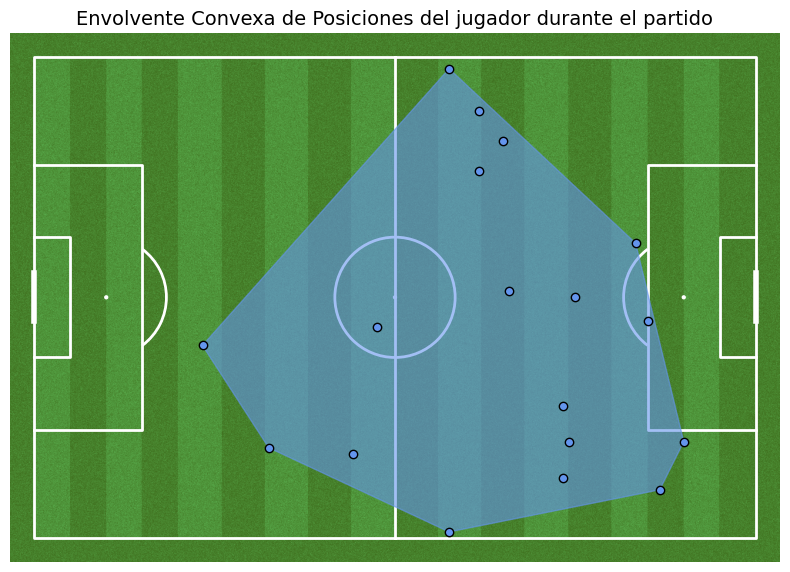

In [ ]:

pitch = Pitch(pitch_color='grass', line_color='white', stripe=True)
fig, ax = pitch.draw(figsize=(8, 6))
hull = pitch.convexhull(df.x, df.y)
poly = pitch.polygon(hull, ax=ax, edgecolor='cornflowerblue', facecolor='cornflowerblue', alpha=0.6)
scatter = pitch.scatter(df.x, df.y, ax=ax, edgecolor='black', facecolor='cornflowerblue')
ax.set_title("Envolvente Convexa de Posiciones del jugador durante el partido", fontsize=14)
plt.show()

<center>

**👨‍💻Implementación👩‍💻**

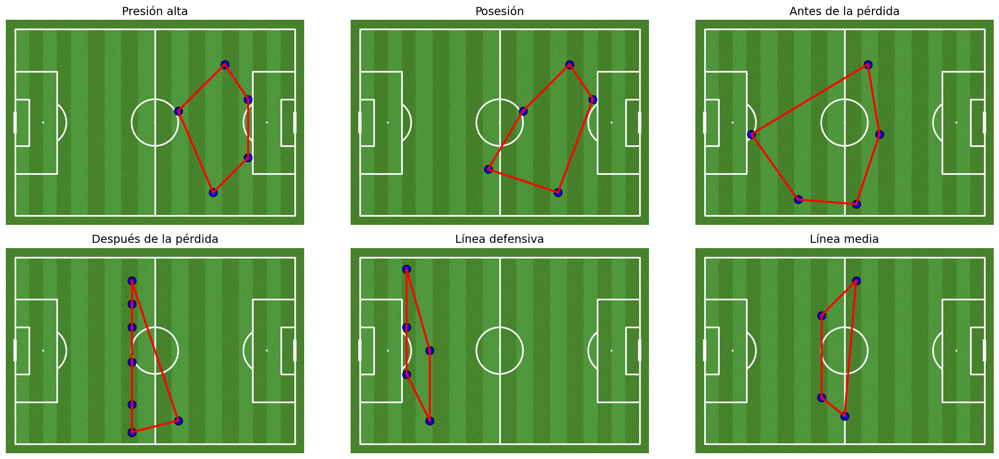

In [ ]:

escenarios = {
    "Presión alta": np.array([
        [90, 15], [85, 70], [70, 35], [100, 30], [100, 55]
    ]),

    "Posesión": np.array([
        [55, 60], [90, 15], [85, 70], [70, 35], [100, 30],

    ]),

    "Antes de la pérdida": np.array([
         [65, 75], [40, 73],
        [75, 45], [20, 45], [70, 15]
    ]),

    "Después de la pérdida": np.array([
        [50, 10], [50, 75], [50, 30], [50, 45], [50, 20],
        [50, 75], [70, 70], [50, 63]
    ]),

    "Línea defensiva": np.array([[20, 30], [30, 70], [20, 5], [20, 50],[30,40]]),

    "Línea media": np.array([[65, 10], [50, 25], [50, 60], [60, 68]]),
}

fig, axs = plt.subplots(2, 3, figsize=(18, 8))
axs = axs.flatten()

for idx, (titulo, puntos) in enumerate(escenarios.items()):
    pitch = Pitch(pitch_color='grass', line_color='white', stripe=True)
    pitch.draw(ax=axs[idx])
    axs[idx].set_title(titulo, fontsize=14)

    pitch.scatter(puntos[:, 0], puntos[:, 1], ax=axs[idx],
                  color='blue', edgecolors='black', s=100, zorder=2)
    if len(puntos) >= 3:
        hull = ConvexHull(puntos)
        for simplex in hull.simplices:
            axs[idx].plot(puntos[simplex, 0], puntos[simplex, 1],
                          'r-', linewidth=2.5, zorder=3)

plt.tight_layout()
plt.show()


<center>

> ⚠️ **Nota:** El siguiente ejemplo de red de pases ha sido adaptado a partir del ejemplo original publicado en la documentación oficial de la librería `mplsoccer`. El recurso original está citado en la sección de Referencias Bibliográficas.



<center>

**👨‍💻Implementación👩‍💻**

In [ ]:

parser = Sbopen()
events, related, freeze, players = parser.event(15946)
TEAM = 'Barcelona'
OPPONENT = 'versus Alavés (A), 2018/19 La Liga'
events.loc[events.tactics_formation.notnull(), 'tactics_id'] = events.loc[events.tactics_formation.notnull(), 'id']
events[['tactics_id', 'tactics_formation']] = events.groupby('team_name')[['tactics_id', 'tactics_formation']].ffill()

**👨‍💻Implementación👩‍💻**

In [ ]:

formation_dict = {1: 'GK', 2: 'RB', 3: 'RCB', 4: 'CB', 5: 'LCB', 6: 'LB', 7: 'RWB',
                  8: 'LWB', 9: 'RDM', 10: 'CDM', 11: 'LDM', 12: 'RM', 13: 'RCM',
                  14: 'CM', 15: 'LCM', 16: 'LM', 17: 'RW', 18: 'RAM', 19: 'CAM',
                  20: 'LAM', 21: 'LW', 22: 'RCF', 23: 'ST', 24: 'LCF', 25: 'SS'}
players['position_abbreviation'] = players.position_id.map(formation_dict)

**👨‍💻Implementación👩‍💻**

In [ ]:

sub = events.loc[events.type_name == 'Substitution',['tactics_id', 'player_id', 'substitution_replacement_id','substitution_replacement_name']]
players_sub = players.merge(sub.rename({'tactics_id': 'id'}, axis='columns'),on=['id', 'player_id'], how='inner', validate='1:1')
players_sub = (players_sub[['id', 'substitution_replacement_id', 'position_abbreviation']].rename({'substitution_replacement_id': 'player_id'}, axis='columns'))
players = pd.concat([players, players_sub])
players.rename({'id': 'tactics_id'}, axis='columns', inplace=True)
players = players[['tactics_id', 'player_id', 'position_abbreviation']]

**👨‍💻Implementación👩‍💻**

In [ ]:

events = events.merge(players, on=['tactics_id', 'player_id'], how='left', validate='m:1')
events = events.merge(players.rename({'player_id': 'pass_recipient_id'},axis='columns'), on=['tactics_id', 'pass_recipient_id'],how='left', validate='m:1', suffixes=['', '_receipt'])

**👨‍💻Implementación👩‍💻**

In [ ]:

events.groupby('team_name').tactics_formation.unique()

,tactics_formation
team_name,
Barcelona,"[442, 433]"
Deportivo Alavés,"[451, 442]"


**👨‍💻Implementación👩‍💻**

In [ ]:

FORMATION = '433'
pass_cols = ['id', 'position_abbreviation', 'position_abbreviation_receipt']
passes_formation = events.loc[(events.team_name == TEAM) & (events.type_name == 'Pass') &(events.tactics_formation == FORMATION) &(events.position_abbreviation_receipt.notnull()), pass_cols].copy()
location_cols = ['position_abbreviation', 'x', 'y']
location_formation = events.loc[(events.team_name == TEAM) &(events.type_name.isin(['Pass', 'Ball Receipt'])) &(events.tactics_formation == FORMATION), location_cols].copy()
average_locs_and_count = (location_formation.groupby('position_abbreviation').agg({'x': ['mean'], 'y': ['mean', 'count']}))
average_locs_and_count.columns = ['x', 'y', 'count']
passes_formation['pos_max'] = (passes_formation[['position_abbreviation','position_abbreviation_receipt']].max(axis='columns'))
passes_formation['pos_min'] = (passes_formation[['position_abbreviation','position_abbreviation_receipt']].min(axis='columns'))
passes_between = passes_formation.groupby(['pos_min', 'pos_max']).id.count().reset_index()
passes_between.rename({'id': 'pass_count'}, axis='columns', inplace=True)
passes_between = passes_between.merge(average_locs_and_count, left_on='pos_min', right_index=True)
passes_between = passes_between.merge(average_locs_and_count, left_on='pos_max', right_index=True, suffixes=['', '_end'])

**👨‍💻Implementación👩‍💻**

In [ ]:

MAX_LINE_WIDTH = 18
MAX_MARKER_SIZE = 3000
passes_between['width'] = (passes_between.pass_count / passes_between.pass_count.max() *MAX_LINE_WIDTH)
average_locs_and_count['marker_size'] = (average_locs_and_count['count']/ average_locs_and_count['count'].max() * MAX_MARKER_SIZE)
MIN_TRANSPARENCY = 0.3
color = np.array(to_rgba('white'))
color = np.tile(color, (len(passes_between), 1))
c_transparency = passes_between.pass_count / passes_between.pass_count.max()
c_transparency = (c_transparency * (1 - MIN_TRANSPARENCY)) + MIN_TRANSPARENCY
color[:, 3] = c_transparency

**👨‍💻Implementación👩‍💻**

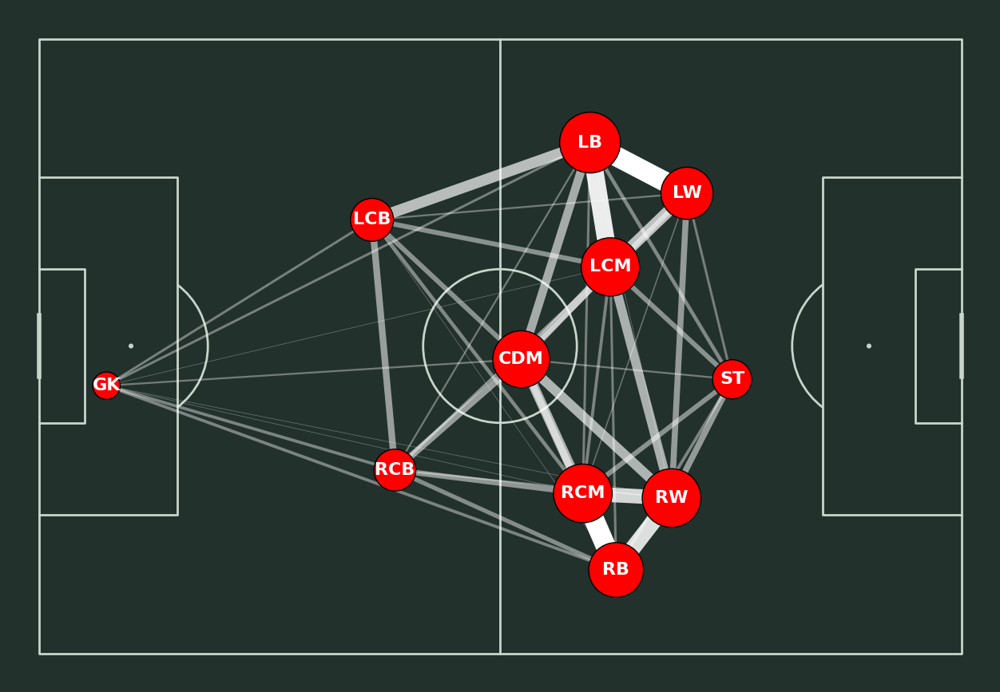

In [ ]:

pitch = Pitch(pitch_type='statsbomb', pitch_color='#22312b', line_color='#c7d5cc')
fig, ax = pitch.draw(figsize=(16, 11), constrained_layout=True, tight_layout=False)
fig.set_facecolor("#22312b")
pass_lines = pitch.lines(passes_between.x, passes_between.y,
                         passes_between.x_end, passes_between.y_end, lw=passes_between.width,
                         color=color, zorder=1, ax=ax)
pass_nodes = pitch.scatter(average_locs_and_count.x, average_locs_and_count.y,
                           s=average_locs_and_count.marker_size,
                           color='red', edgecolors='black', linewidth=1, alpha=1, ax=ax)
for index, row in average_locs_and_count.iterrows():
    pitch.annotate(row.name, xy=(row.x, row.y), c='white', va='center',
                   ha='center', size=16, weight='bold', ax=ax)

<center>

# **Referencias Bibliográficas**

**Referencias Bibliográficas**

- Ferro, R. (2018). *ConvexHull* [Código fuente]. GitHub. https://github.com/RodolfoFerro/ConvexHull

- Graham, R. L. (1972). An efficient algorithm for determining the convex hull of a finite planar set. *Information Processing Letters, 1*(4), 132–133. https://doi.org/10.1016/0020-0190(72)90045-2

- Preparata, F. P., & Shamos, M. I. (1985). *Computational geometry: An introduction*. Springer-Verlag.

- Barber, C. B., Dobkin, D. P., & Huhdanpaa, H. (1996). The Quickhull algorithm for convex hulls. ACM Transactions on Mathematical Software (TOMS), 22(4), 469–483. https://doi.org/10.1145/235815.235821

- SciPy Developers. (2024). scipy.spatial.ConvexHull. En SciPy v1.11.0 Reference Guide. https://docs.scipy.org/doc/scipy/reference/generated/scipy.spatial.ConvexHull.html

- Davies, A. (n.d.). Pass network. mplsoccer documentation. Recuperado el 15 de abril de 2025 de https://mplsoccer.readthedocs.io/en/latest/gallery/pitch_plots/plot_pass_network.html